In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from statsmodels.tsa.arima.model import ARIMA
import warnings
warnings.filterwarnings("ignore")
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense


In [2]:
df = pd.read_csv("D:\\machine learning data\\assessment\\GlobalWeatherRepository.csv")
df.head(6)


,country,location_name,latitude,longitude,timezone,last_updated_epoch,last_updated,temperature_celsius,temperature_fahrenheit,condition_text,...,air_quality_PM2.5,air_quality_PM10,air_quality_us-epa-index,air_quality_gb-defra-index,sunrise,sunset,moonrise,moonset,moon_phase,moon_illumination
0,Afghanistan,Kabul,34.52,69.18,Asia/Kabul,1715849100,2024-05-16 13:15,26.6,79.8,Partly Cloudy,...,8.4,26.6,1,1,04:50 AM,06:50 PM,12:12 PM,01:11 AM,Waxing Gibbous,55
1,Albania,Tirana,41.33,19.82,Europe/Tirane,1715849100,2024-05-16 10:45,19.0,66.2,Partly cloudy,...,1.1,2.0,1,1,05:21 AM,07:54 PM,12:58 PM,02:14 AM,Waxing Gibbous,55
2,Algeria,Algiers,36.76,3.05,Africa/Algiers,1715849100,2024-05-16 09:45,23.0,73.4,Sunny,...,10.4,18.4,1,1,05:40 AM,07:50 PM,01:15 PM,02:14 AM,Waxing Gibbous,55
3,Andorra,Andorra La Vella,42.50,1.52,Europe/Andorra,1715849100,2024-05-16 10:45,6.3,43.3,Light drizzle,...,0.7,0.9,1,1,06:31 AM,09:11 PM,02:12 PM,03:31 AM,Waxing Gibbous,55
4,Angola,Luanda,-8.84,13.23,Africa/Luanda,1715849100,2024-05-16 09:45,26.0,78.8,Partly cloudy,...,183.4,262.3,5,10,06:12 AM,05:55 PM,01:17 PM,12:38 AM,Waxing Gibbous,55
5,Antigua and Barbuda,Saint John's,17.12,-61.85,America/Antigua,1715849100,2024-05-16 04:45,26.0,78.8,Partly cloudy,...,1.2,4.5,1,1,05:36 AM,06:32 PM,01:05 PM,01:14 AM,Waxing Gibbous,55


In [3]:
# missing values
missing_summary = df.isnull().sum()
df_cleaned = df.drop_duplicates()
df_cleaned['last_updated'] = pd.to_datetime(df_cleaned['last_updated'])
scaler = MinMaxScaler()
df_cleaned[['temperature_celsius', 'precip_mm']] = scaler.fit_transform(
    df_cleaned[['temperature_celsius', 'precip_mm']]
)
missing_summary.head(10)


country                   0
location_name             0
latitude                  0
longitude                 0
timezone                  0
last_updated_epoch        0
last_updated              0
temperature_celsius       0
temperature_fahrenheit    0
condition_text            0
dtype: int64

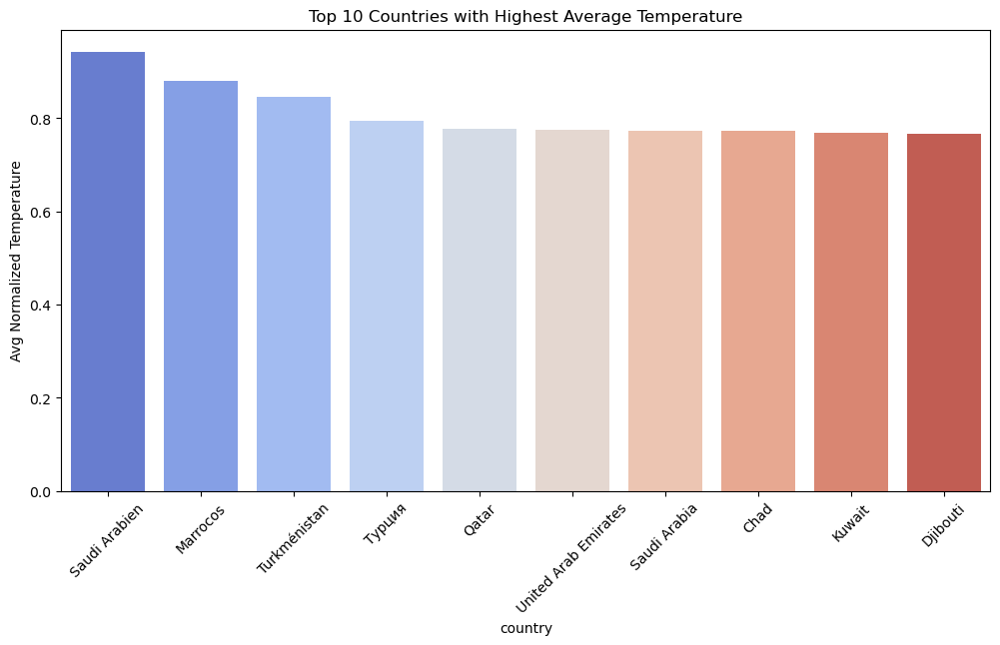

In [4]:
# Plot average temperature per country
temp_country = df_cleaned.groupby('country')['temperature_celsius'].mean().sort_values(ascending=False).head(10)

plt.figure(figsize=(12,6))
sns.barplot(x=temp_country.index, y=temp_country.values, palette="coolwarm")
plt.xticks(rotation=45)
plt.title("Top 10 Countries with Highest Average Temperature")
plt.ylabel("Avg Normalized Temperature")
plt.show()

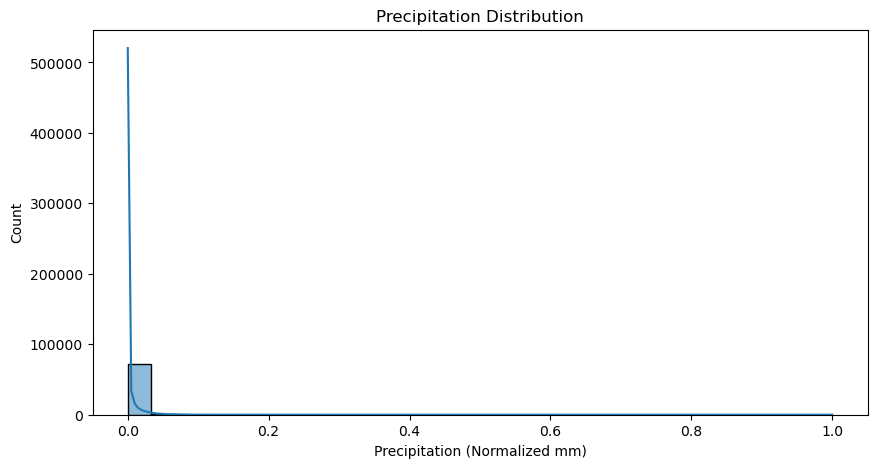

In [5]:
plt.figure(figsize=(10,5))
sns.histplot(df_cleaned['precip_mm'], bins=30, kde=True)
plt.title("Precipitation Distribution")
plt.xlabel("Precipitation (Normalized mm)")
plt.show()


In [6]:
ny_data = df_cleaned[df_cleaned['location_name'] == "New York"].copy()
ny_data = ny_data.sort_values(by='last_updated')

In [7]:
from statsmodels.tsa.arima.model import ARIMA

# Prepare the series
series = ny_data.set_index('last_updated')['temperature_celsius']

# Fit ARIMA model
model = ARIMA(series, order=(3,1,2))
model_fit = model.fit()

# Forecast next 10 days
forecast = model_fit.forecast(steps=10)

forecast


1     0.688259
2     0.688259
3     0.688259
4     0.688259
5     0.688259
6     0.688259
7     0.688259
8     0.688259
9     0.688259
10    0.688259
Name: predicted_mean, dtype: float64

In [8]:
from scipy.stats import zscore

# Detect anomalies in temperature
df_cleaned['z_temp'] = zscore(df_cleaned['temperature_celsius'])
anomalies = df_cleaned[df_cleaned['z_temp'].abs() > 3]

anomalies[['country', 'location_name', 'temperature_celsius', 'z_temp']].head()


,country,location_name,temperature_celsius,z_temp
29235,Mongolia,Ulaanbaatar,0.222672,-3.261324
29820,Mongolia,Ulaanbaatar,0.229420,-3.208013
30015,Mongolia,Ulaanbaatar,0.253711,-3.016091
30405,Mongolia,Ulaanbaatar,0.245614,-3.080065
30600,Mongolia,Ulaanbaatar,0.195682,-3.474571


In [9]:
region_climate = df_cleaned.groupby('country')[['temperature_celsius', 'humidity']].mean().sort_values(by='temperature_celsius', ascending=False).head(10)
region_climate


,temperature_celsius,humidity
country,,
Saudi Arabien,0.943320,7.000000
Marrocos,0.879892,14.000000
Turkménistan,0.846154,11.000000
Турция,0.794872,44.000000
Qatar,0.777389,38.672000
United Arab Emirates,0.776032,43.704787
Saudi Arabia,0.773453,16.390374
Chad,0.773014,33.465426
Kuwait,0.769026,25.106383


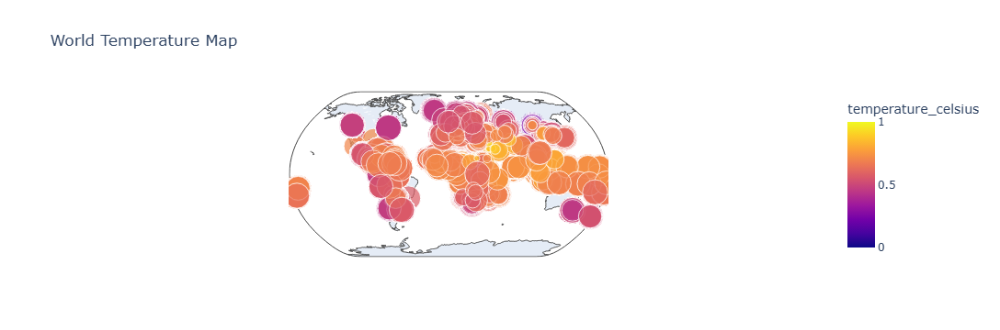

In [10]:
import plotly.express as px

fig = px.scatter_geo(df_cleaned,
                     lat='latitude', lon='longitude',
                     color='temperature_celsius',
                     hover_name='location_name',
                     size='humidity',
                     title='World Temperature Map',
                     projection='natural earth')
fig.show()


In [11]:
print("Shape:", df.shape)
print("Columns:", df.columns)


Shape: (73070, 41)
Columns: Index(['country', 'location_name', 'latitude', 'longitude', 'timezone',
       'last_updated_epoch', 'last_updated', 'temperature_celsius',
       'temperature_fahrenheit', 'condition_text', 'wind_mph', 'wind_kph',
       'wind_degree', 'wind_direction', 'pressure_mb', 'pressure_in',
       'precip_mm', 'precip_in', 'humidity', 'cloud', 'feels_like_celsius',
       'feels_like_fahrenheit', 'visibility_km', 'visibility_miles',
       'uv_index', 'gust_mph', 'gust_kph', 'air_quality_Carbon_Monoxide',
       'air_quality_Ozone', 'air_quality_Nitrogen_dioxide',
       'air_quality_Sulphur_dioxide', 'air_quality_PM2.5', 'air_quality_PM10',
       'air_quality_us-epa-index', 'air_quality_gb-defra-index', 'sunrise',
       'sunset', 'moonrise', 'moonset', 'moon_phase', 'moon_illumination'],
      dtype='object')


In [12]:
#columns for air quality correlation
features = ['temperature_celsius', 'humidity', 'wind_kph', 'precip_mm', 'air_quality_Carbon_Monoxide', 
            'air_quality_Ozone', 'air_quality_Nitrogen_dioxide', 'air_quality_Sulphur_dioxide', 'air_quality_PM2.5', 
            'air_quality_PM10']

df_selected = df[features].dropna()

print("Filtered rows:", df_selected.shape)

Filtered rows: (73070, 10)


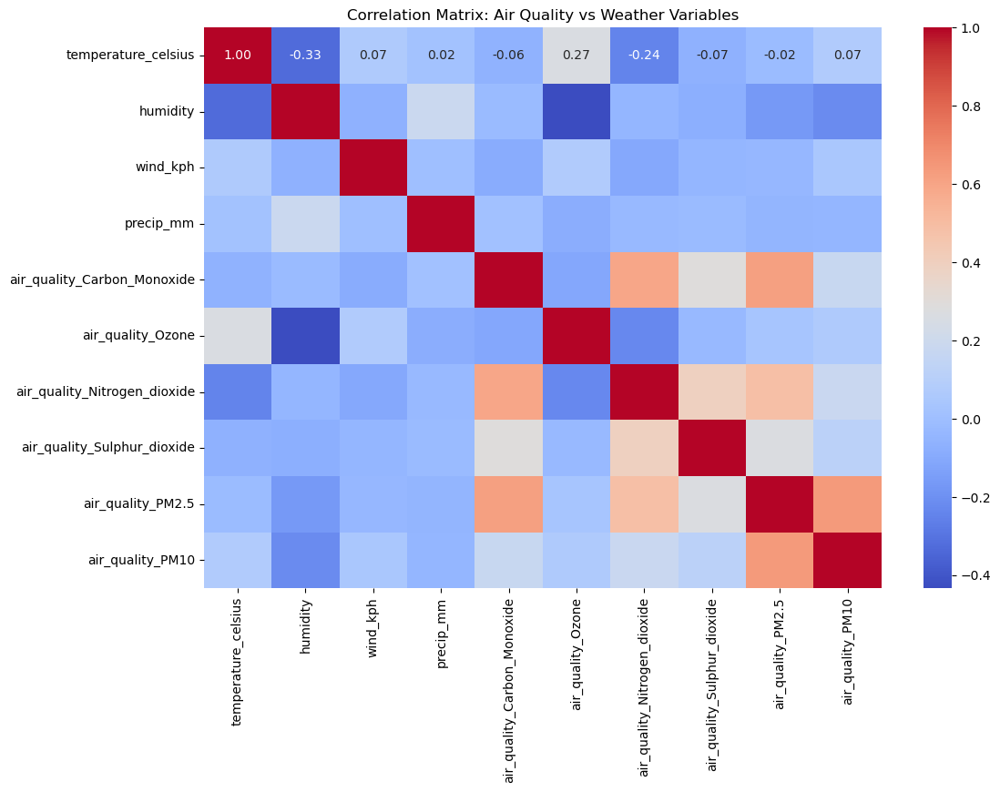

In [13]:
# correlation
corr_matrix = df_selected.corr()

plt.figure(figsize=(12,8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Matrix: Air Quality vs Weather Variables")
plt.show()

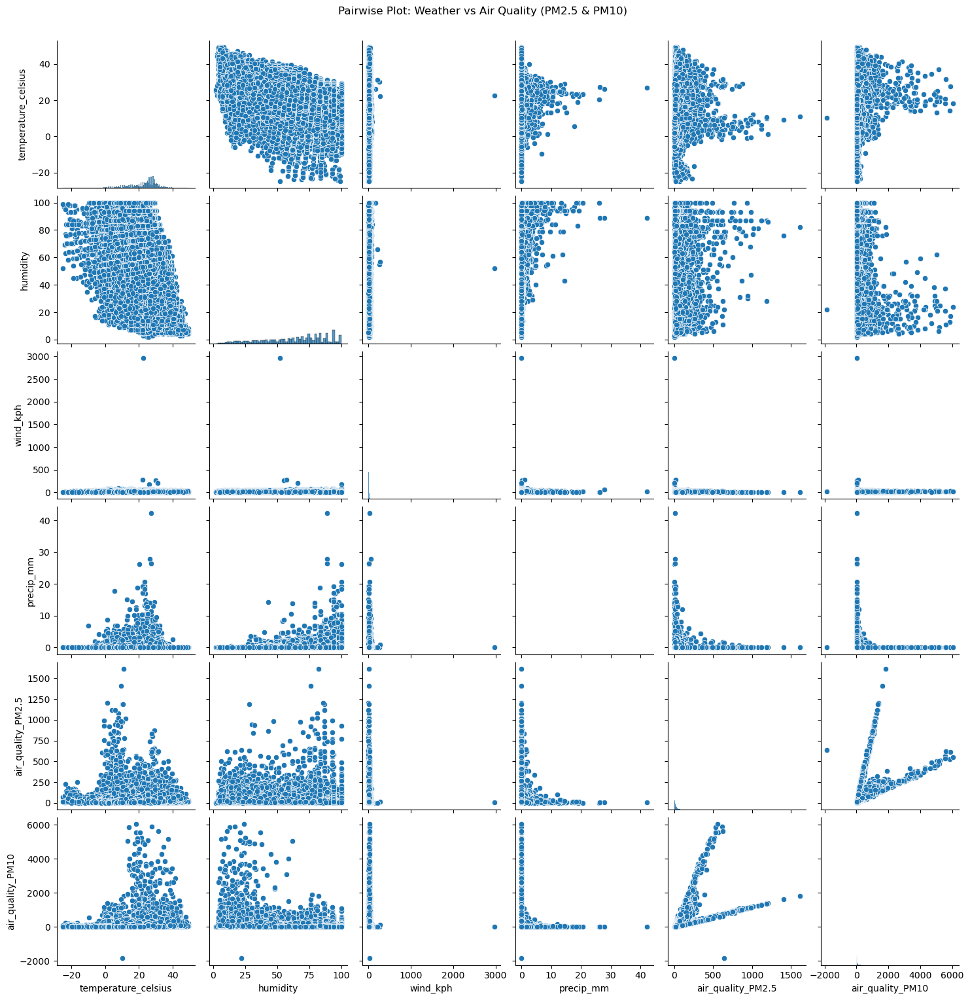

In [14]:
sns.pairplot(df_selected[['temperature_celsius', 'humidity', 'wind_kph', 'precip_mm', 
                          'air_quality_PM2.5', 'air_quality_PM10']])
plt.suptitle("Pairwise Plot: Weather vs Air Quality (PM2.5 & PM10)", y=1.02)
plt.show()

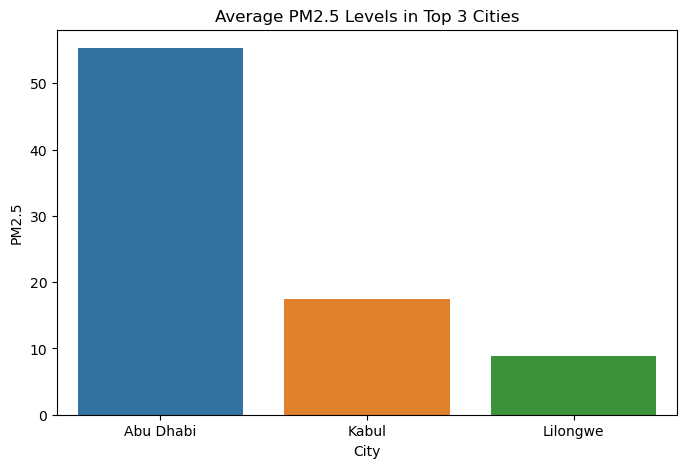

In [15]:
top_cities = df['location_name'].value_counts().index[:3]
df_cities = df[df['location_name'].isin(top_cities)]

city_pm = df_cities.groupby('location_name')['air_quality_PM2.5'].mean().reset_index()

plt.figure(figsize=(8,5))
sns.barplot(data=city_pm, x='location_name', y='air_quality_PM2.5')
plt.title("Average PM2.5 Levels in Top 3 Cities")
plt.ylabel("PM2.5")
plt.xlabel("City")
plt.show()